In [1]:
import os
import cv2
import numpy as np
import random
import tensorflow as tf
from tqdm import tqdm
from matplotlib import pyplot as plt

class GAN:

    def __init__(self, low_path_train = "./", high_path_train = "./", low_path_test = "./", high_path_test = "./", num_epochs = 150, batch_size = 64, img_Width = 100, img_Height = 100, img_Depth = 1, Valid_split=0.2):
        # The batch size we'll use for training
        tf.test.gpu_device_name()
        tf.keras.backend.clear_session()



        self.Low_Imgs_Train_Path = low_path_train
        self.High_Imgs_Train_Path = high_path_train
        self.Low_Imgs_Test_Path = low_path_test
        self.High_Imgs_Test_Path = high_path_test
        try:
          print("in model training model")
          self.Low_Imgs = sorted(os.listdir(f"{self.Low_Imgs_Train_Path}/Images/"))
          self.High_Imgs = sorted(os.listdir(f"{self.High_Imgs_Train_Path}/Images/"))
          self.batch_size = batch_size
          self.steps_per_epoch = (len(self.Low_Imgs))//batch_size
          self.validation_steps =  int((len(self.Low_Imgs))//batch_size * Valid_split)

        except:
           print("in model testing model")
        self.seed = 24
        self.num_epochs = num_epochs

        self.IMG_WIDTH = img_Width
        self.IMG_HEIGHT = img_Height
        self.IMG_DEPTH = img_Depth

        self.history = {
            'gen_loss': [],
            'disc_loss': [],
            'gen_acc': [],
            'disc_acc': [],
            'disc_precision': [],
            'disc_recall': [],
            'gen_precision': [],
            'gen_recall': []
        }

        self.low_data_gen_args = dict(
                            rescale=1/255,
                            rotation_range=90,
                            width_shift_range=0.3,
                            height_shift_range=0.3,
                            shear_range=0.5,
                            zoom_range=0.3,
                            horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='reflect',
                            validation_split=Valid_split)

        self.high_data_gen_args = dict(
                            rescale=1/255,
                            rotation_range=90,
                            width_shift_range=0.3,
                            height_shift_range=0.3,
                            shear_range=0.5,
                            zoom_range=0.3,
                            horizontal_flip=True,
                            vertical_flip=True,
                            fill_mode='reflect',
                            validation_split=Valid_split)


    def Review_Training_data(self,):


      print(f"found {len(self.Low_Imgs)} images for training")

      image_number = random.randint(0, len(self.Low_Imgs))

      print(self.Low_Imgs_Train_Path + self.Low_Imgs[image_number])
      print(self.High_Imgs_Train_Path + self.High_Imgs[image_number])

      test_low_Imgs = cv2.imread(f"{self.Low_Imgs_Train_Path}/Images/{self.Low_Imgs[image_number]}")
      test_high_Imgs = cv2.imread(f"{self.High_Imgs_Train_Path}/Images/{self.High_Imgs[image_number]}")
      print(f"image size = {test_low_Imgs.shape}")
      plt.figure(figsize=(12, 6))
      plt.subplot(121)
      plt.imshow(test_low_Imgs)
      plt.subplot(122)
      plt.imshow(test_high_Imgs)
      plt.show()



    def Gen_block(self, input, num_filters, kernel_size):
        Layer = tf.keras.layers.Conv2D( num_filters , kernel_size= kernel_size , strides=1 )( input )
        Layer = tf.keras.layers.LeakyReLU()( Layer )
        return Layer

    def Dis_block(self, num_filters, kernel_size, img_Width = None, img_Height = None, img_Depth = None):
        Layers = [
        tf.keras.layers.Conv2D( num_filters , kernel_size=kernel_size , strides=1 , activation='relu' , input_shape=( img_Width, img_Height, img_Depth ) ),
        tf.keras.layers.Conv2D( num_filters , kernel_size=kernel_size , strides=1, activation='relu'  ),
        tf.keras.layers.MaxPooling2D(),
        ]

        return Layers

    def Dis_Dense(self, ):

        Dense_Layer = [
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense( 512, activation='relu'  )  ,
        tf.keras.layers.Dense( 128 , activation='relu' ) ,
        tf.keras.layers.Dense( 16 , activation='relu' ) ,
        tf.keras.layers.Dense( 1 , activation='sigmoid' )
        ]

        return Dense_Layer

    def Build_Generator(self,):

        inputs = tf.keras.layers.Input( shape=(self.IMG_HEIGHT, self.IMG_WIDTH, self.IMG_DEPTH))

        Layer1 = self.Gen_block(input = inputs, num_filters = 16 , kernel_size=( 5 , 5 ))
        Layer1 = self.Gen_block(input = Layer1, num_filters = 32 , kernel_size=( 3 , 3 ))
        Layer1 = self.Gen_block(input = Layer1, num_filters = 32 , kernel_size=( 3 , 3 ))

        Layer2 = self.Gen_block(input = Layer1, num_filters = 32 , kernel_size=( 5 , 5 ))
        Layer2 = self.Gen_block(input = Layer2, num_filters = 64 , kernel_size=( 3 , 3 ))
        Layer2 = self.Gen_block(input = Layer2, num_filters = 64 , kernel_size=( 3 , 3 ))

        Layer3 = self.Gen_block(input = Layer2, num_filters = 64 , kernel_size=( 5 , 5 ))
        Layer3 = self.Gen_block(input = Layer3, num_filters = 128 , kernel_size=( 3 , 3 ))
        Layer3 = self.Gen_block(input = Layer3, num_filters = 128 , kernel_size=( 3 , 3 ))


        bottleneck = tf.keras.layers.Conv2D( 128 , kernel_size=( 3 , 3 ) , strides=1 , activation='tanh' , padding='same' )( Layer3 )

        concat1 = tf.keras.layers.Concatenate()( [ bottleneck , Layer3 ] )
        Layer_Up3 = tf.keras.layers.Conv2DTranspose( 128 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' )( concat1 )
        Layer_Up3 = tf.keras.layers.Conv2DTranspose( 128 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' )( Layer_Up3 )
        Layer_Up3 = tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 5 , 5 ) , strides=1 , activation='relu' )( Layer_Up3 )

        concat2 = tf.keras.layers.Concatenate()( [ Layer_Up3 , Layer2 ] )
        Layer_Up2 = tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' )( concat2 )
        Layer_Up2 = tf.keras.layers.Conv2DTranspose( 64 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu' )( Layer_Up2 )
        Layer_Up2 = tf.keras.layers.Conv2DTranspose( 32 , kernel_size=( 5 , 5 ) , strides=1 , activation='relu' )( Layer_Up2 )

        concat3 = tf.keras.layers.Concatenate()( [ Layer_Up2 , Layer1 ] )
        Layer_Up1 = tf.keras.layers.Conv2DTranspose( 32 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu')( concat3 )
        Layer_Up1 = tf.keras.layers.Conv2DTranspose( 32 , kernel_size=( 3 , 3 ) , strides=1 , activation='relu')( Layer_Up1 )
        Layer_Up1 = tf.keras.layers.Conv2DTranspose( 3 , kernel_size=( 5 , 5 ) , strides=1 , activation='relu')( Layer_Up1 )

        model = tf.keras.models.Model( inputs , Layer_Up1 )
        return model

    def Build_Discriminator(self, ):


        Layer1 = self.Dis_block(32, ( 7 , 7 ), self.IMG_HEIGHT, self.IMG_WIDTH, self.IMG_DEPTH)

        Layer2 = self.Dis_block(64, ( 5 , 5 ))

        Layer3 = self.Dis_block(128, ( 3 , 3 ))

        Layer4 = self.Dis_block(256, ( 3 , 3 ))

        Dense_Layer = self.Dis_Dense()

        layers = Layer1 + Layer2 + Layer3 + Layer4 +Dense_Layer

        model = tf.keras.models.Sequential( layers )
        return model

    def Build_Models(self, ):
        self.MSE = tf.keras.losses.MeanSquaredError()
        self.Generator_Optimizer = tf.keras.optimizers.Adam( 0.0005 )
        self.Discriminator_Optimizer = tf.keras.optimizers.Adam( 0.0005 )
        self.Cross_Entropy = tf.keras.losses.BinaryCrossentropy()

        self.Generator_Model = self.Build_Generator()
        self.Discriminator_Model = self.Build_Discriminator()


    def Model_Specs(self, ):
       self.Generator_Model.summary()
       self.Discriminator_Model.summary()


    def Discriminator_Loss(self, real_output, fake_output):

        real_loss = self.Cross_Entropy(tf.ones_like(real_output) - tf.random.uniform( shape=real_output.shape , maxval=0.1 ) , real_output)
        fake_loss = self.Cross_Entropy(tf.zeros_like(fake_output) + tf.random.uniform( shape=fake_output.shape , maxval=0.1  ) , fake_output)
        total_loss = real_loss + fake_loss
        return total_loss

    def Generator_Loss(self, fake_output , real_y):
        real_y = tf.cast( real_y , 'float32' )
        return self.MSE( fake_output , real_y )

    @tf.function
    def Train_Step(self, input_x , real_y ):

        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            # Generate an image -> G( x )
            generated_images = self.Generator_Model( input_x , training=True)
            # Probability that the given image is real -> D( x )
            real_output = self.Discriminator_Model( real_y, training=True)
            # Probability that the given image is the one generated -> D( G( x ) )
            generated_output = self.Discriminator_Model(generated_images, training=True)

            # L2 Loss -> || y - G(x) ||^2
            gen_loss = self.Generator_Loss( generated_images , real_y )
            # Log loss for the Discriminator_Model
            disc_loss = self.Discriminator_Loss( real_output, generated_output )

        #tf.keras.backend.print_tensor( tf.keras.backend.mean( gen_loss ) )
        #tf.keras.backend.print_tensor( gen_loss + disc_loss )

        # Compute the gradients
        gradients_of_generator = gen_tape.gradient(gen_loss, self.Generator_Model.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(disc_loss, self.Discriminator_Model.trainable_variables)

        # Optimize with Adam
        self.Generator_Optimizer.apply_gradients(zip(gradients_of_generator, self.Generator_Model.trainable_variables))
        self.Discriminator_Optimizer.apply_gradients(zip(gradients_of_discriminator, self.Discriminator_Model.trainable_variables))
        # ----------------------------
        #   Calculate accuracies
        # ----------------------------
        # For the discriminator:
        #   - Real images => label = 1
        #   - Generated images => label = 0
        #   - We'll interpret "output >= 0.5 => predicted real"
        real_acc = tf.reduce_mean(tf.cast(real_output >= 0.5, tf.float32))
        fake_acc = tf.reduce_mean(tf.cast(generated_output < 0.5, tf.float32))
        disc_acc = 0.5 * (real_acc + fake_acc)

        # For the generator (how often the generated images are classified as real)
        gen_acc = tf.reduce_mean(tf.cast(generated_output >= 0.5, tf.float32))

        # ----------------------------
        #   Calculate precision/recall
        # ----------------------------
        # Discriminator:
        #   TP = # of real images classified as real
        #   FP = # of generated images classified as real
        #   FN = # of real images classified as fake
        TP = tf.reduce_sum(tf.cast(real_output >= 0.5, tf.float32))
        FP = tf.reduce_sum(tf.cast(generated_output >= 0.5, tf.float32))
        FN = tf.reduce_sum(tf.cast(real_output < 0.5, tf.float32))

        disc_precision = TP / (TP + FP + 1e-7)
        disc_recall    = TP / (TP + FN + 1e-7)

        # Generator (not standard, but you can define it in a parallel manner):
        #   "Positive" = "Discriminator says it's real"
        #   So for generator:
        #   TP_g = # of generated images predicted real
        #   FP_g = # of real images predicted real (somewhat forced analogy)
        #   FN_g = # of generated images predicted fake
        TP_g = tf.reduce_sum(tf.cast(generated_output >= 0.5, tf.float32))
        FP_g = tf.reduce_sum(tf.cast(real_output >= 0.5, tf.float32))
        FN_g = tf.reduce_sum(tf.cast(generated_output < 0.5, tf.float32))

        gen_precision = TP_g / (TP_g + FP_g + 1e-7)
        gen_recall    = TP_g / (TP_g + FN_g + 1e-7)

        return (gen_loss, disc_loss, gen_acc, disc_acc, disc_precision, disc_recall, gen_precision, gen_recall)



    @tf.function
    def Validation_Step(self, input_x, real_y):

        # Generate images
        generated_images = self.Generator_Model(input_x, training=False)

        # Get discriminator outputs
        real_output = self.Discriminator_Model(real_y, training=False)
        fake_output = self.Discriminator_Model(generated_images, training=False)

        # Calculate the generator's loss (e.g., L2)
        gen_loss = self.Generator_Loss(generated_images, real_y)

        # Calculate the discriminator's loss
        disc_loss = self.Discriminator_Loss(real_output, fake_output)

        # Accuracy for D
        real_acc = tf.reduce_mean(tf.cast(real_output >= 0.5, tf.float32))
        fake_acc = tf.reduce_mean(tf.cast(fake_output < 0.5, tf.float32))
        disc_acc = 0.5 * (real_acc + fake_acc)

        # Accuracy for G
        gen_acc = tf.reduce_mean(tf.cast(fake_output >= 0.5, tf.float32))

        # Precision/Recall for D
        TP = tf.reduce_sum(tf.cast(real_output >= 0.5, tf.float32))
        FP = tf.reduce_sum(tf.cast(fake_output >= 0.5, tf.float32))
        FN = tf.reduce_sum(tf.cast(real_output < 0.5, tf.float32))
        disc_precision = TP / (TP + FP + 1e-7)
        disc_recall = TP / (TP + FN + 1e-7)

        # Precision/Recall for G
        TP_g = tf.reduce_sum(tf.cast(fake_output >= 0.5, tf.float32))
        FP_g = tf.reduce_sum(tf.cast(real_output >= 0.5, tf.float32))
        FN_g = tf.reduce_sum(tf.cast(fake_output < 0.5, tf.float32))
        gen_precision = TP_g / (TP_g + FP_g + 1e-7)
        gen_recall = TP_g / (TP_g + FN_g + 1e-7)

        return (gen_loss, disc_loss, gen_acc, disc_acc, disc_precision, disc_recall, gen_precision, gen_recall)

    def Low_High_generator(self, image_generator, mask_generator):
      train_generator = zip(image_generator, mask_generator)
      for (img, mask) in train_generator:
          yield (img, mask)

    def Data_Generation(self, ):
      low_data_generator = tf.keras.preprocessing.image.ImageDataGenerator(**self.low_data_gen_args)
      high_data_generator = tf.keras.preprocessing.image.ImageDataGenerator(**self.high_data_gen_args)

      print(self.Low_Imgs_Train_Path)
      self.low_generator = low_data_generator.flow_from_directory(
          directory=self.Low_Imgs_Train_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'training',
          seed=self.seed

      )


      print(self.High_Imgs_Train_Path)
      self.high_generator = high_data_generator.flow_from_directory(
          directory=self.High_Imgs_Train_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'training',
          seed=self.seed

      )



      print(self.Low_Imgs_Test_Path)
      self.valid_low_generator = low_data_generator.flow_from_directory(
          directory=self.Low_Imgs_Test_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'validation',
          seed=self.seed

      )


      print(self.High_Imgs_Test_Path)
      self.valid_high_generator = high_data_generator.flow_from_directory(
          directory=self.High_Imgs_Test_Path,
          target_size=(self.IMG_HEIGHT, self.IMG_WIDTH),
          color_mode='rgb',
          batch_size=self.batch_size,
          class_mode=None,
          subset = 'validation',
          seed=self.seed

      )


      self.train_gen =self.Low_High_generator(self.low_generator, self.high_generator)
      self.val_gen = self.Low_High_generator(self.valid_low_generator, self.valid_high_generator)

      return self.train_gen, self.val_gen

    def Reviw_Gen_Data(self, ):
      x = next(self.low_generator)
      y = next(self.high_generator)
      for i in range(0,5):
          image = x[i]
          mask = y[i]
          plt.subplot(1,2,1)
          plt.imshow(image)
          plt.subplot(1,2,2)
          plt.imshow(mask)
          plt.show()





    def Run_Training(self, gen_Save_path, dis_Save_path):
        for epoch in range(self.num_epochs):
            # ----- Training phase -----
            epoch_gen_loss = []
            epoch_disc_loss = []
            epoch_gen_acc = []
            epoch_disc_acc = []
            epoch_disc_precision = []
            epoch_disc_recall = []
            epoch_gen_precision = []
            epoch_gen_recall = []

            with tqdm(total=self.steps_per_epoch, desc=f"Epoch {epoch+1}/{self.num_epochs}") as pbar:
                for step in range(self.steps_per_epoch):
                    x, y = next(self.train_gen)
                    (gen_loss, disc_loss, gen_acc, disc_acc, disc_precision, disc_recall, gen_precision, gen_recall) = self.Train_Step(x, y)

                    # Convert to python floats
                    gen_loss_val  = float(gen_loss.numpy())
                    disc_loss_val = float(disc_loss.numpy())
                    gen_acc_val   = float(gen_acc.numpy())
                    disc_acc_val  = float(disc_acc.numpy())
                    dp_val        = float(disc_precision.numpy())
                    dr_val        = float(disc_recall.numpy())
                    gp_val        = float(gen_precision.numpy())
                    gr_val        = float(gen_recall.numpy())

                    epoch_gen_loss.append(gen_loss_val)
                    epoch_disc_loss.append(disc_loss_val)
                    epoch_gen_acc.append(gen_acc_val)
                    epoch_disc_acc.append(disc_acc_val)
                    epoch_disc_precision.append(dp_val)
                    epoch_disc_recall.append(dr_val)
                    epoch_gen_precision.append(gp_val)
                    epoch_gen_recall.append(gr_val)

                    pbar.set_postfix({
                        'G_loss': f"{gen_loss_val:.4f}",
                        'D_loss': f"{disc_loss_val:.4f}",
                        'G_acc':  f"{gen_acc_val:.4f}",
                        'D_acc':  f"{disc_acc_val:.4f}"
                    })
                    pbar.update(1)

            # end of training loop for this epoch
            mean_gen_loss   = np.mean(epoch_gen_loss)
            mean_disc_loss  = np.mean(epoch_disc_loss)
            mean_gen_acc    = np.mean(epoch_gen_acc)
            mean_disc_acc   = np.mean(epoch_disc_acc)
            mean_dp         = np.mean(epoch_disc_precision)
            mean_dr         = np.mean(epoch_disc_recall)
            mean_gp         = np.mean(epoch_gen_precision)
            mean_gr         = np.mean(epoch_gen_recall)

            self.history['gen_loss'].append(mean_gen_loss)
            self.history['disc_loss'].append(mean_disc_loss)
            self.history['gen_acc'].append(mean_gen_acc)
            self.history['disc_acc'].append(mean_disc_acc)
            self.history['disc_precision'].append(mean_dp)
            self.history['disc_recall'].append(mean_dr)
            self.history['gen_precision'].append(mean_gp)
            self.history['gen_recall'].append(mean_gr)

            # ----- Validation phase -----
            val_gen_loss = []
            val_disc_loss = []
            val_gen_acc = []
            val_disc_acc = []
            val_disc_precision = []
            val_disc_recall = []
            val_gen_precision = []
            val_gen_recall = []

            for v_step in range(self.validation_steps):
                x_val, y_val = next(self.val_gen)

                (gen_loss_v, disc_loss_v,
                gen_acc_v, disc_acc_v,
                disc_precision_v, disc_recall_v,
                gen_precision_v, gen_recall_v) = self.Validation_Step(x_val, y_val)

                val_gen_loss.append(float(gen_loss_v.numpy()))
                val_disc_loss.append(float(disc_loss_v.numpy()))
                val_gen_acc.append(float(gen_acc_v.numpy()))
                val_disc_acc.append(float(disc_acc_v.numpy()))
                val_disc_precision.append(float(disc_precision_v.numpy()))
                val_disc_recall.append(float(disc_recall_v.numpy()))
                val_gen_precision.append(float(gen_precision_v.numpy()))
                val_gen_recall.append(float(gen_recall_v.numpy()))

            # After finishing validation steps
            mean_val_gen_loss   = np.mean(val_gen_loss)
            mean_val_disc_loss  = np.mean(val_disc_loss)
            mean_val_gen_acc    = np.mean(val_gen_acc)
            mean_val_disc_acc   = np.mean(val_disc_acc)
            mean_val_disc_prec  = np.mean(val_disc_precision)
            mean_val_disc_rec   = np.mean(val_disc_recall)
            mean_val_gen_prec   = np.mean(val_gen_precision)
            mean_val_gen_rec    = np.mean(val_gen_recall)

            # Store in history as well
            # (You might want new keys or just keep consistent naming like "gen_val_loss".)
            self.history.setdefault('val_gen_loss', []).append(mean_val_gen_loss)
            self.history.setdefault('val_disc_loss', []).append(mean_val_disc_loss)
            self.history.setdefault('val_gen_acc', []).append(mean_val_gen_acc)
            self.history.setdefault('val_disc_acc', []).append(mean_val_disc_acc)
            self.history.setdefault('val_disc_precision', []).append(mean_val_disc_prec)
            self.history.setdefault('val_disc_recall', []).append(mean_val_disc_rec)
            self.history.setdefault('val_gen_precision', []).append(mean_val_gen_prec)
            self.history.setdefault('val_gen_recall', []).append(mean_val_gen_rec)

        # End of all epochs
        self.Generator_Model.save(gen_Save_path)
        self.Discriminator_Model.save(dis_Save_path)



    def plot_training_history(self):
        epochs = range(1, len(self.history['gen_loss']) + 1)

        plt.figure(figsize=(16, 8))

        # ----- LOSS -----
        plt.subplot(2, 2, 1)
        plt.plot(epochs, self.history['gen_loss'],  label='Train Generator Loss')
        plt.plot(epochs, self.history['disc_loss'], label='Train Discriminator Loss')
        if 'val_gen_loss' in self.history and 'val_disc_loss' in self.history:
            plt.plot(epochs, self.history['val_gen_loss'],  label='Val Generator Loss')
            plt.plot(epochs, self.history['val_disc_loss'], label='Val Discriminator Loss')
        plt.title("Loss")
        plt.xlabel("Epochs")
        plt.ylabel("Value")
        plt.legend()

        # ----- ACCURACY -----
        plt.subplot(2, 2, 2)
        plt.plot(epochs, self.history['gen_acc'],  label='Train Generator Acc')
        plt.plot(epochs, self.history['disc_acc'], label='Train Discriminator Acc')
        if 'val_gen_acc' in self.history and 'val_disc_acc' in self.history:
            plt.plot(epochs, self.history['val_gen_acc'],  label='Val Generator Acc')
            plt.plot(epochs, self.history['val_disc_acc'], label='Val Discriminator Acc')
        plt.title("Accuracy")
        plt.xlabel("Epochs")
        plt.ylabel("Value")
        plt.legend()

        # ----- PRECISION (D) -----
        plt.subplot(2, 2, 3)
        plt.plot(epochs, self.history['disc_precision'], label='Train Disc Precision')
        if 'val_disc_precision' in self.history:
            plt.plot(epochs, self.history['val_disc_precision'], label='Val Disc Precision')
        plt.title("Discriminator Precision")
        plt.xlabel("Epochs")
        plt.ylabel("Value")
        plt.legend()

        # ----- RECALL (D) -----
        plt.subplot(2, 2, 4)
        plt.plot(epochs, self.history['disc_recall'], label='Train Disc Recall')
        if 'val_disc_recall' in self.history:
            plt.plot(epochs, self.history['val_disc_recall'], label='Val Disc Recall')
        plt.title("Discriminator Recall")
        plt.xlabel("Epochs")
        plt.ylabel("Value")
        plt.legend()

        plt.tight_layout()
        plt.show()

    def Review_Model(self, model_path, High_images_test, Low_images_test):

        model = tf.keras.models.load_model(model_path)

        self.Low_Imgs = sorted(os.listdir(Low_images_test))
        self.High_Imgs = sorted(os.listdir(High_images_test))
        for High_test, Low_test in zip(self.High_Imgs, self.Low_Imgs):
            print(High_test, Low_test)
            low_light = cv2.imread(Low_images_test+Low_test)
            high_light = cv2.imread(High_images_test+High_test)

            low_light = cv2.resize(low_light,  (self.IMG_HEIGHT, self.IMG_WIDTH))
            high_light = cv2.resize(high_light,  (self.IMG_HEIGHT, self.IMG_WIDTH))

            test_img = low_light/255.0
            high_light = high_light/255.0
            test_img = np.expand_dims(test_img, axis=0)
            result = model.predict(test_img)

            result=np.squeeze(result)

            plt.figure(figsize=(16, 4))  # Widen the figure to accommodate 4 subplots

            # 1) Result
            plt.subplot(1, 4, 1)
            plt.imshow(result)
            plt.title("Result")

            # 2) High Light
            plt.subplot(1, 4, 2)
            plt.imshow(high_light)
            plt.title("High Light")

            # 3) Low Light
            plt.subplot(1, 4, 3)
            plt.imshow(low_light)
            plt.title("Low Light")

            # 4) High - Result
            plt.subplot(1, 4, 4)
            plt.imshow(high_light - result)
            plt.title("High - Result")

            plt.tight_layout()
            plt.show()

2025-01-15 02:40:44.824059: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-01-15 02:40:44.830264: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-15 02:40:44.837247: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-15 02:40:44.839301: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-15 02:40:44.845538: I tensorflow/core/platform/cpu_feature_guar

I0000 00:00:1736901655.315179  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736901655.318825  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736901655.318987  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736901655.362838  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

in model training model


/home/el7agadel/.local/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 252, 252,  │      1,216 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 252, 252,  │          0 │ conv2d[0][0]      │
│ (LeakyReLU)         │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 250, 250,  │      4,640 │ leaky_re_lu[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 250, 250,  │          0 │ conv2d_1[0][0]    │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 248, 248,  │      9,248 │ leaky_re_lu_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 248, 248,  │          0 │ conv2d_2[0][0]    │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 244, 244,  │     25,632 │ leaky_re_lu_2[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 244, 244,  │          0 │ conv2d_3[0][0]    │
│ (LeakyReLU)         │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 242, 242,  │     18,496 │ leaky_re_lu_3[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 242, 242,  │          0 │ conv2d_4[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 240, 240,  │     36,928 │ leaky_re_lu_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_5       │ (None, 240, 240,  │          0 │ conv2d_5[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 236, 236,  │    102,464 │ leaky_re_lu_5[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_6       │ (None, 236, 236,  │          0 │ conv2d_6[0][0]    │
│ (LeakyReLU)         │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 234, 234,  │     73,856 │ leaky_re_lu_6[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_7       │ (None, 234, 234,  │          0 │ conv2d_7[0][0]  

 Total params: 1,407,203 (5.37 MB)

 Trainable params: 1,407,203 (5.37 MB)

 Non-trainable params: 0 (0.00 B)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_10 (Conv2D)              │ (None, 250, 250, 32)   │         4,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 244, 244, 32)   │        50,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 122, 122, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 118, 118, 64)   │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 114, 114, 64)   │       102,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 57, 57, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 55, 55, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 53, 53, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 22, 22, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 11, 11, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 30976)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    15,860,224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        65,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 16)             │         2,064 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,243,329 (65.78 MB)

 Trainable params: 17,243,329 (65.78 MB)

 Non-trainable params: 0 (0.00 B)

/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/
Found 19500 images belonging to 1 classes.
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/
Found 19500 images belonging to 1 classes.
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/
Found 10500 images belonging to 1 classes.
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/
Found 10500 images belonging to 1 classes.
found 30000 images for training
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/light_7920.jpg
/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/light_7920.jpg
image size = (512, 512, 3)


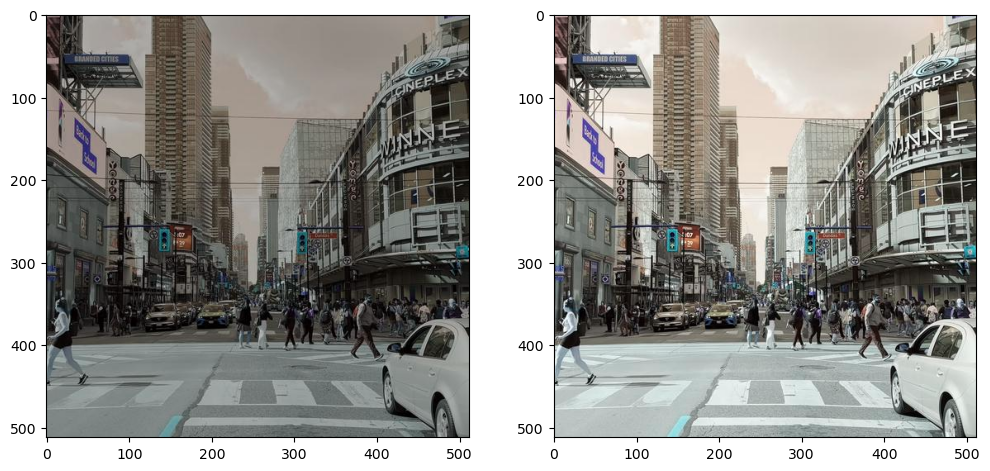

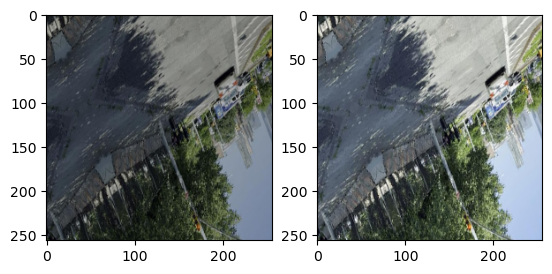

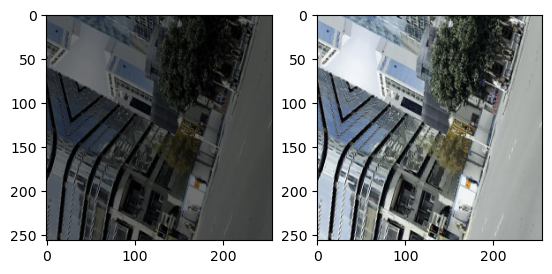

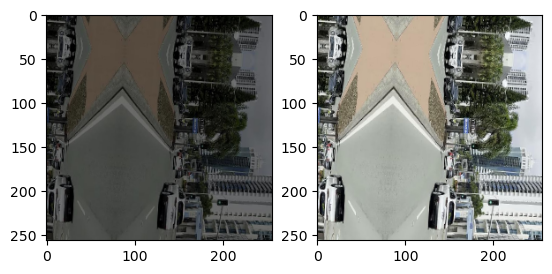

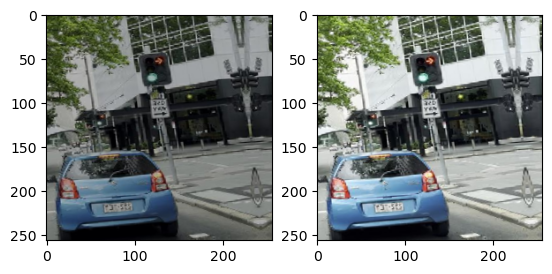

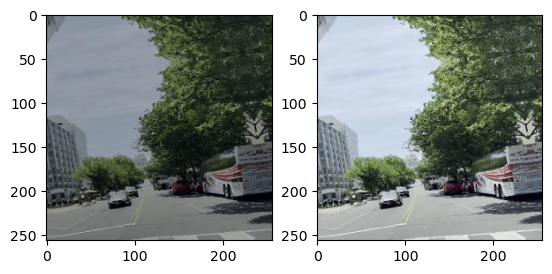

Epoch 1/20:   0%|          | 0/3000 [00:00<?, ?it/s]2025-01-15 02:40:59.166482: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
W0000 00:00:1736901659.195260  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1736901659.210615  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1736901659.213131  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1736901659.214119  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1736901659.215014  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1736901659.216055  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1736901659.221208  301342 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be

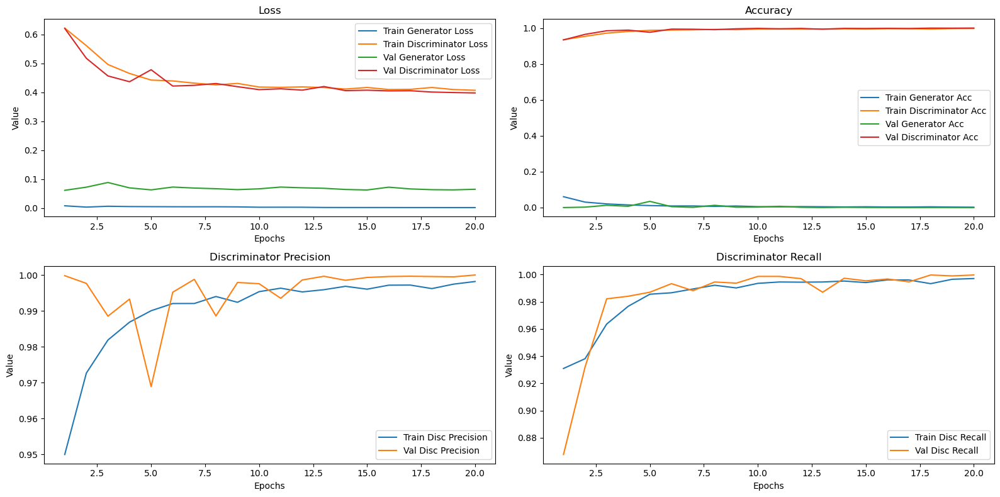

In [2]:



High_images = "/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/High/"
Low_images = "/home/el7agadel/masters/image processing/project/LoLI-Street Dataset/Train/Low/"


Generator_save_path = "/home/el7agadel/masters/image processing/project/lol_dataset/Generator.h5"
Discriminator_save_path = "/home/el7agadel/masters/image processing/project/lol_dataset/Discriminator.h5"

network = GAN(low_path_train = Low_images, high_path_train = High_images, low_path_test = Low_images, high_path_test = High_images,  num_epochs = 20, batch_size = 10, img_Width = 256, img_Height = 256, img_Depth = 3, Valid_split=0.35)

network.Build_Models()
network.Model_Specs()
network.Data_Generation()
network.Review_Training_data()
network.Reviw_Gen_Data()
network.Run_Training(Generator_save_path, Discriminator_save_path)
network.plot_training_history()








I0000 00:00:1736930804.481388  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736930804.481521  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736930804.481568  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1736930804.481641  301179 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

in model training model
in model testing model
1.png 1.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


I0000 00:00:1736930806.246402  301341 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


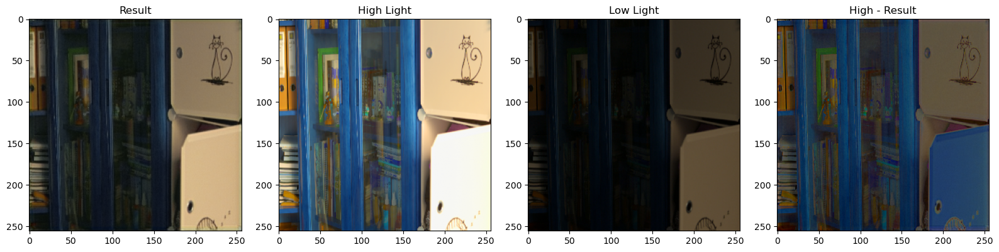

111.png 111.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


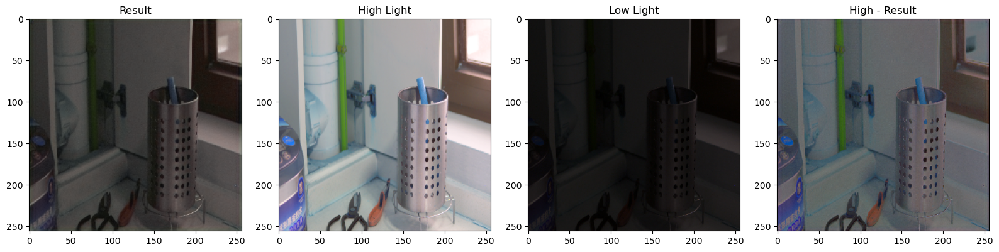

146.png 146.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


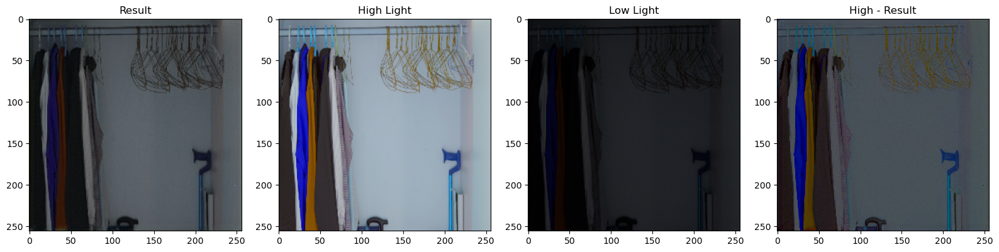

179.png 179.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


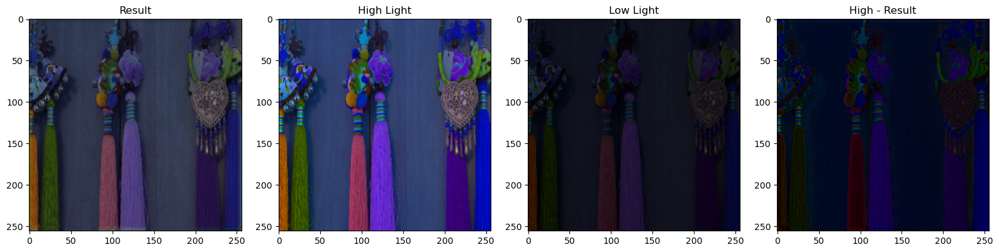

22.png 22.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


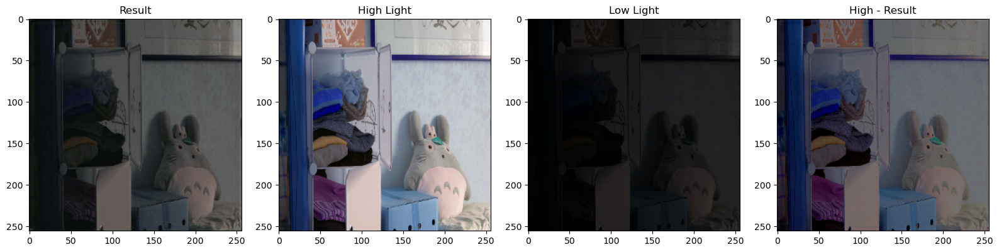

23.png 23.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step


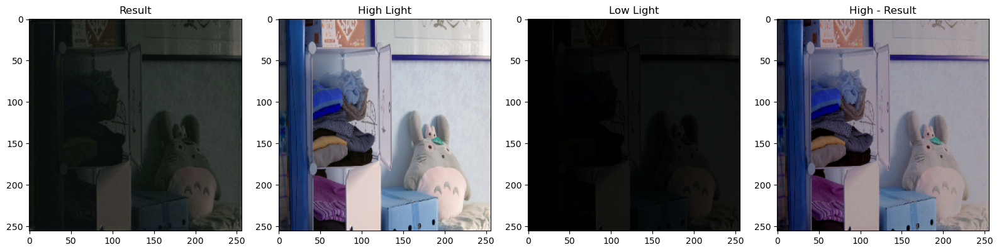

493.png 493.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


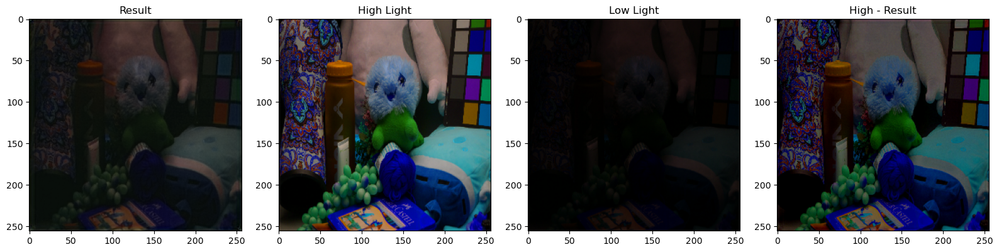

547.png 547.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


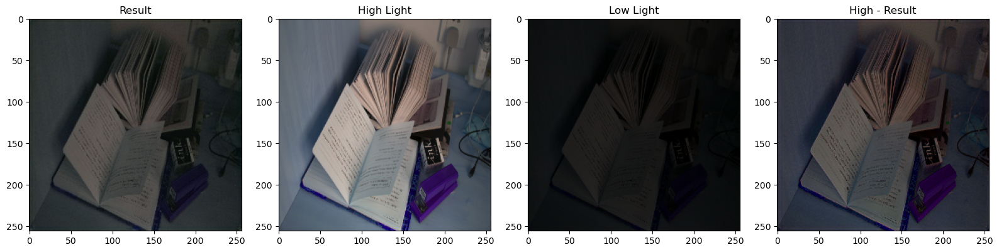

55.png 55.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


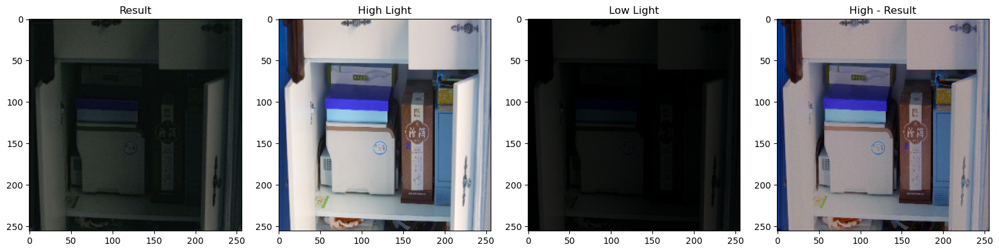

665.png 665.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


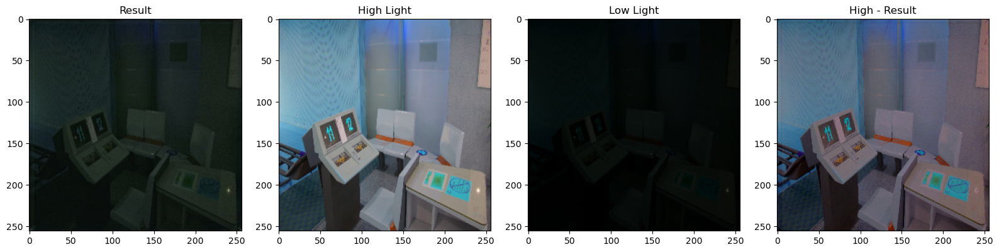

669.png 669.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


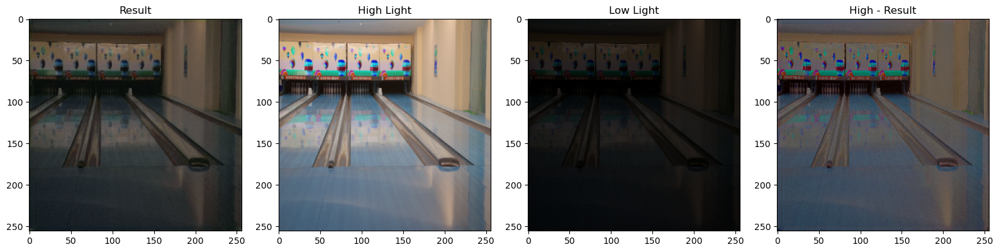

748.png 748.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step


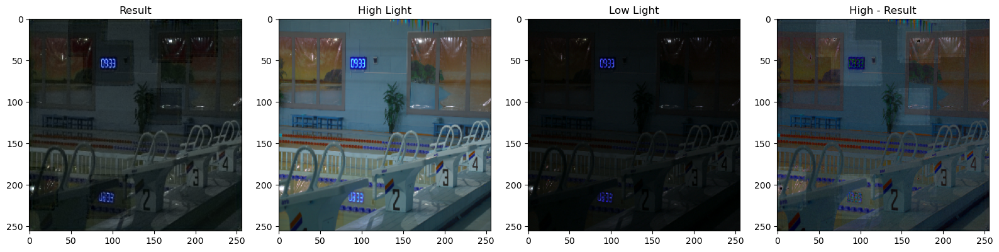

778.png 778.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


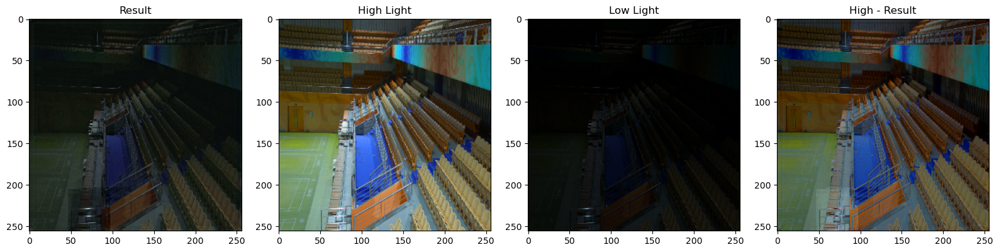

780.png 780.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


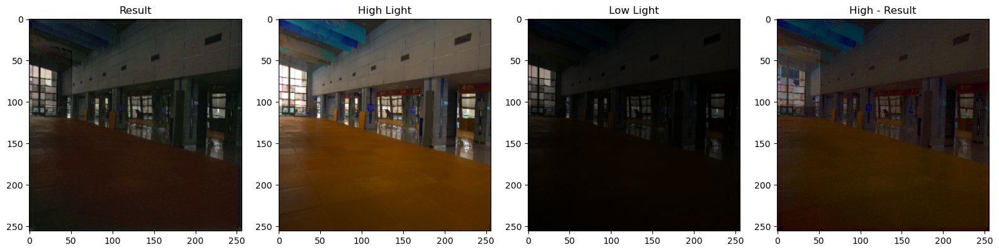

79.png 79.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


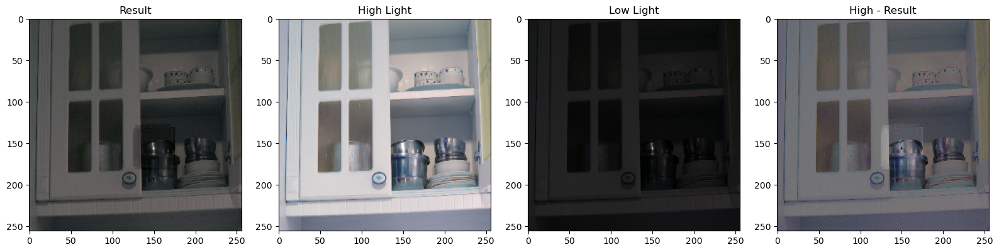

In [3]:
model_path = "/home/el7agadel/masters/image processing/project/lol_dataset/Generator.h5"

High_images_test = "/home/el7agadel/masters/image processing/project/lol_dataset/eval15/High/Images/"
Low_images_test = "/home/el7agadel/masters/image processing/project/lol_dataset/eval15/Low/Images/"

network = GAN(img_Width = 256, img_Height = 256, img_Depth = 3)

network.Review_Model(model_path, High_images_test, Low_images_test)

